In [1]:
from Utils.files import mkExpDir
from dataset import dataloader
from model import Extracter
from loss.loss import get_loss_dict
from trainer import Trainer

import os
import torch
import torch.nn as nn
import numpy as np
import warnings
import glob
import time

from argparse import Namespace
from torchinfo import summary
from Utils.ploting import plot_results

warnings.filterwarnings('ignore')

# Args

In [2]:
from argparse import Namespace

In [3]:
args   = Namespace()

In [4]:
## log setting
args.save_dir      = 'save_dir_reside_indoor_2025_p2'
args.reset         =  True
args.log_file_name = 'reside_indoor.log'
args.logger_name   = 'reside_indoor'
## device setting
args.cpu           = False
args.num_gpu       = 1
## dataset setting
args.dataset       = 'RESIDE'                                               
args.num_workers   = 1                                                      

In [5]:
args.dataset_dir        = r'/home/esteban/Data/RESIDE-IN' 

## model setting

In [6]:
args.img_training_size = (620, 460)
args.num_res_blocks    = '16+16+8+4' # Residual blocks for features [IFE, lv1, lv2, lv3]
args.num_grad_blocks   = '16+9+9+9'   # Residual blocks for features [IFE, lv1, lv2, lv3]
args.n_feats           = 64          # The number of channels in network
args.res_scale         = 1.0         # Residual scale
args.top_k             = 3           # Top K matches for each patch
args.feature_ext_type  = 'vgg19'
args.rec_w             = 1.0         # The weight of reconstruction loss

In [7]:
## Patch Setting and Top Features Setting
args.unfold_kernel_size = 6
args.stride             = 2
args.padding            = 2

## optimizer setting

In [8]:
args.beta1          = 0.9    # The beta1 in Adam optimizer
args.beta2          = 0.999  # The beta2 in Adam optimizer
args.eps            = 1e-8   # The eps in Adam optimizer

args.lr_rate        = 1e-5   # Learning rate
args.lr_rate_lte    = 1e-5  # Learning rate of LTE
args.decay          = 1e-4   # Learning rate decay type
args.gamma          = 0.5    # Learning rate decay factor for step decay

## training setting

In [9]:
args.batch_size      = 1    # Training batch size
args.num_init_epochs = 200  # The number of init epochs which are trained with only reconstruction loss
args.print_every     = 600  # Print period
args.save_every      = 1    # Save period
args.val_every       = 1    # Validation period
args.show_every      = 5    # Plot Results

## evaluate / test / finetune setting
args.eval              = True                      # Evaluation mode
args.eval_save_results = False                     # Save each image during evaluation
args.model_path        = None                      # The path of model to evaluation
args.test              = False                     # Test mode

In [10]:
args.img_size          = (620, 460)
args.ref_as_refsr      = False

# Main



In [11]:
# make save_dir
_logger     = mkExpDir(args)

In [12]:
# dataloader of training set and testing set
_dataloader = dataloader.get_dataloader(args) if (not args.test) else None

In [13]:
len(_dataloader['train'].dataset.input_list), len(_dataloader['train'].dataset.ref_list)

(13990, 13990)

## device

In [14]:
device = torch.device('cpu' if args.cpu else 'cuda') # Choose CPU or GPU
torch.cuda.set_device(0)                             # Select GPI ID

## model

In [15]:
_model    = Extracter.Extracter(args).to(device)

if ((not args.cpu) and (args.num_gpu > 1)):
  _model  = nn.DataParallel(_model, list(range(args.num_gpu)))

_loss_all = get_loss_dict(args, _logger)
t         = Trainer(args, _logger, _dataloader, _model, _loss_all)

In [16]:
summary(_model)

Layer (type:depth-idx)                   Param #
Extracter                                --
├─FE: 1-1                                --
│    └─Sequential: 2-1                   --
│    │    └─Conv2d: 3-1                  1,792
│    │    └─ReLU: 3-2                    --
│    └─Sequential: 2-2                   --
│    │    └─Conv2d: 3-3                  36,928
│    │    └─ReLU: 3-4                    --
│    │    └─MaxPool2d: 3-5               --
│    │    └─Conv2d: 3-6                  73,856
│    │    └─ReLU: 3-7                    --
│    └─Sequential: 2-3                   --
│    │    └─Conv2d: 3-8                  147,584
│    │    └─ReLU: 3-9                    --
│    │    └─MaxPool2d: 3-10              --
│    │    └─Conv2d: 3-11                 295,168
│    │    └─ReLU: 3-12                   --
│    └─MeanShift: 2-4                    (12)
├─SR: 1-2                                --
│    └─SFE: 2-5                          --
│    │    └─Conv2d: 3-13                 1,792
│

In [17]:
t.load('save_dir_reside_indoor_2025/model/model_00148.pt')

[trainer.py file line:52] - INFO: load_model_path: save_dir_reside_indoor_2025/model/model_00148.pt


In [66]:
import math
import numpy as np
import logging
import cv2
import os
import shutil

import torch
import seaborn as sns
import matplotlib.pyplot as plt

# Save results
def prepare(sample_batched, device):
    for key in sample_batched.keys():
        sample_batched[key] = sample_batched[key].to(device)
    return sample_batched

def plot_results(model = None, dataloader = None, total_images = 5, save = False, epoch = 0, device = None, args = None) :
    i = 0
    for names, sample_batched in dataloader['test'] :
        sample_batched = prepare(sample_batched, device)
        lr             = sample_batched['LR']
        hr             = sample_batched['HR']
        ref            = sample_batched['Ref']
        ref_sr         = sample_batched['Ref_sr']
        
        if names[0].split('/')[-1].split('_')[1] == '10.png' :
            print(names[0])

            model.eval()
            with torch.no_grad():
                sr, S, _, _, _ = model(lr = lr, ref = ref, refsr = ref_sr)
                sr_save = (sr+1.) * 127.5

                lr     = (lr     + 1) * 127.5
                hr     = (hr     + 1) * 127.5
                ref    = (ref    + 1) * 127.5
                ref_sr = (ref_sr + 1) * 127.5

                sr_save_ = np.transpose(sr_save[0].squeeze().round().cpu().numpy(), (1, 2, 0)).astype(np.uint8)
                lr_      = np.transpose(lr[0].squeeze().round().cpu().numpy(), (1, 2, 0)).astype(np.uint8)
                hr_      = np.transpose(hr[0].squeeze().round().cpu().numpy(), (1, 2, 0)).astype(np.uint8)


                grid_dehaze_name = '/home/esteban/lizmark/2025/GridDehazeNet/indoor_results/' + names[0].split('/')[-1]
                grid_dehaze_img  = plt.imread(grid_dehaze_name)

                # plot

                names       = ['Haze', 'GridDehazeNet', 'Extracter', 'Target']
                num_classes = len(names)

                fig, ax = plt.subplots(figsize = (50,20), nrows = 1, ncols = 4, sharex = True, sharey = True,)
                ax      = ax.flatten()

                ax[0].imshow(lr_)
                ax[1].imshow(grid_dehaze_img)
                ax[2].imshow(sr_save_)
                ax[3].imshow(hr_)
                
                ax[0].set_xticks([])
                ax[0].set_yticks([])
                plt.show()

                if save :
                    # Save the full figure...
                    fig.savefig(args.save_dir + '/model_' + str(epoch) + '_' + str(i) + '.png', bbox_inches='tight')

            if i == total_images - 1 : 
                return
            i += 1

/home/esteban/Data/RESIDE-IN/test/GT/1400_10.png


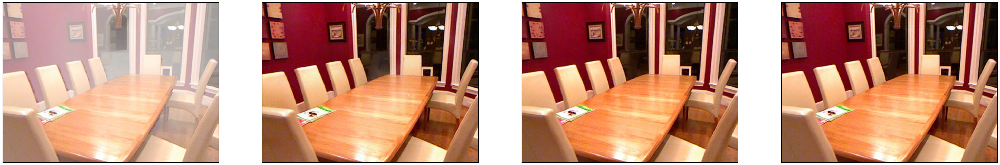

/home/esteban/Data/RESIDE-IN/test/GT/1401_10.png


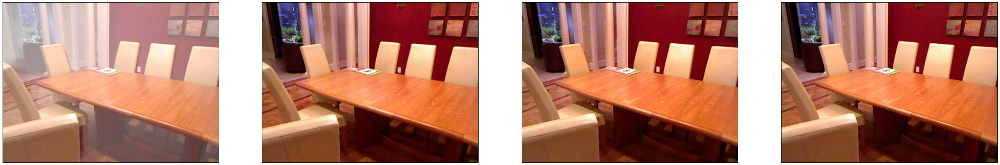

/home/esteban/Data/RESIDE-IN/test/GT/1402_10.png


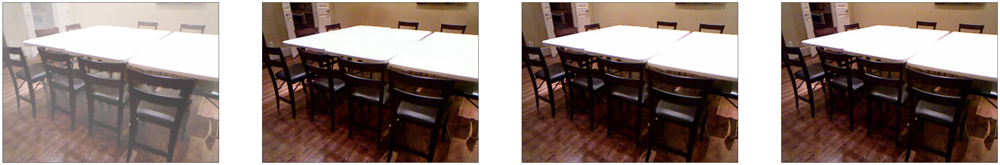

/home/esteban/Data/RESIDE-IN/test/GT/1403_10.png


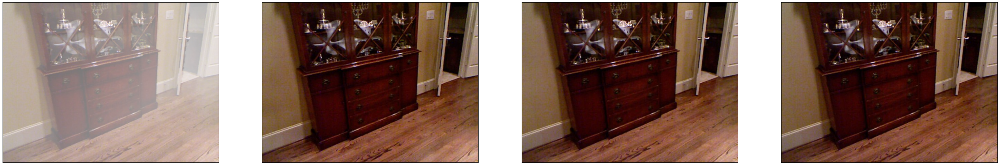

/home/esteban/Data/RESIDE-IN/test/GT/1404_10.png


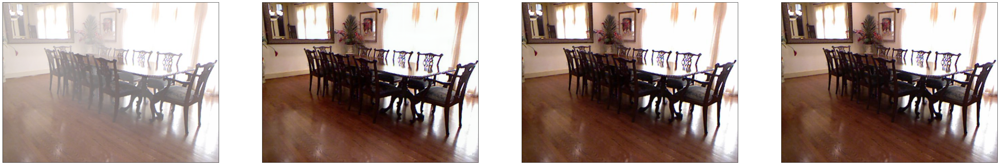

In [67]:
plot_results(model = t.model, dataloader = _dataloader, total_images = 5, save = True, epoch = 148, device = device, args = args)